# Task
Train a YOLOv8 classification model using images located in `Dataset/Final/0`, `Dataset/Final/1`, and `Dataset/Final/2` by verifying dataset paths, splitting and resizing images, generating a data configuration file, and performing model training.

## Import All Modules

In [60]:
import os
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt
import yaml
from ultralytics import YOLO
import math
import shutil

## Verify Dataset Paths

### Subtask:
Confirm the existence of the specified dataset directories (`dataset/final/0`, `dataset/final/1`, `dataset/final/2`) and display a sample of the images to ensure correct paths and content.


**Reasoning**:
The first step is to import necessary libraries, define the directory paths, and verify their existence. This ensures the environment is set up correctly before proceeding with image sampling and display.



In [61]:
directories = [
    'Dataset/Final/0',
    'Dataset/Final/1',
    'Dataset/Final/2'
]

print("Verifying dataset directory existence:")
for directory in directories:
    if os.path.exists(directory):
        print(f"Directory '{directory}' exists.")
    else:
        print(f"Directory '{directory}' does not exist. Please check the path.")


Verifying dataset directory existence:
Directory 'Dataset/Final/0' exists.
Directory 'Dataset/Final/1' exists.
Directory 'Dataset/Final/2' exists.


**Reasoning**:
Now that the directories are verified, the next step is to sample and display images from each directory to confirm their content as per the subtask instructions.



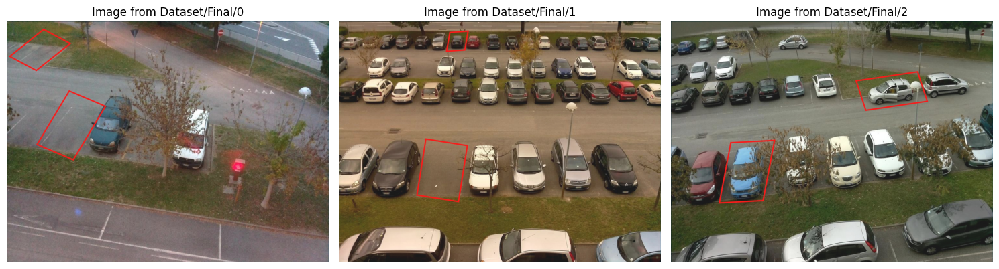

In [62]:
plt.figure(figsize=(15, 5))
image_count = 0

for i, directory in enumerate(directories):
    image_paths = glob.glob(os.path.join(directory, '*.jpg')) + glob.glob(os.path.join(directory, '*.png'))

    if not image_paths:
        print(f"No image files found in '{directory}'.")
        continue

    # Select one random image per directory for display
    sample_image_path = random.choice(image_paths)

    try:
        img = Image.open(sample_image_path)
        image_count += 1
        plt.subplot(1, len(directories), image_count)
        plt.imshow(img)
        plt.title(f'Image from {directory}')
        plt.axis('off')
    except Exception as e:
        print(f"Could not open image {sample_image_path}: {e}")

plt.tight_layout()
plt.show()


## Split, Resize, and Organize Dataset for YOLOv8 Classification

### Subtask:
Create training and validation splits from the raw data. Resize all images to a uniform size to handle slight variations in dimensions. Organize the resized images into the directory structure expected by YOLOv8 for classification (e.g., `dataset/train/0`, `dataset/val/1`, etc.).


In [63]:
# 1. Define target image size and train-validation split ratio
TARGET_IMAGE_SIZE = (224, 224)  # YOLOv8 typically uses square images
TRAIN_SPLIT_RATIO = 0.8

# Base directories for the original dataset (already defined in previous cells)
# directories = [
#     'dataset/final/0',
#     'dataset/final/1',
#     'dataset/final/2'
# ]

# Output directories
BASE_OUTPUT_DIR = 'processed_dataset'
TRAIN_DIR = os.path.join(BASE_OUTPUT_DIR, 'train')
VAL_DIR = os.path.join(BASE_OUTPUT_DIR, 'val')

# 2. Create the base output directories for the organized dataset
print(f"Creating output directories: {TRAIN_DIR} and {VAL_DIR}")

os.makedirs(TRAIN_DIR, exist_ok=True)
os.makedirs(VAL_DIR, exist_ok=True)

print("Output directories created successfully.")

Creating output directories: processed_dataset\train and processed_dataset\val
Output directories created successfully.


Now that the base directories are set up, we will iterate through each class directory, split the images into training and validation sets, resize them to the target size, and then save them to the appropriate new directories, as specified in the instructions.



In [64]:
# Initialize dictionaries to store counts for verification
train_counts = {}
val_counts = {}

print("Starting image splitting, resizing, and organization...")

for original_dir in directories:
    class_label = os.path.basename(original_dir) # e.g., '0', '1', '2'

    # Get all image paths for the current class
    all_image_paths = glob.glob(os.path.join(original_dir, '*.jpg')) + glob.glob(os.path.join(original_dir, '*.png'))
    random.shuffle(all_image_paths)

    if not all_image_paths:
        print(f"No image files found in '{original_dir}'. Skipping.")
        continue

    # Split into training and validation sets
    split_index = int(len(all_image_paths) * TRAIN_SPLIT_RATIO)
    train_images = all_image_paths[:split_index]
    val_images = all_image_paths[split_index:]

    # Create class-specific directories in train and val
    os.makedirs(os.path.join(TRAIN_DIR, class_label), exist_ok=True)
    os.makedirs(os.path.join(VAL_DIR, class_label), exist_ok=True)

    # Process training images
    train_count = 0
    for img_path in train_images:
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(TARGET_IMAGE_SIZE, Image.LANCZOS)

            dest_path = os.path.join(TRAIN_DIR, class_label, os.path.basename(img_path))
            img_resized.save(dest_path)
            train_count += 1
        except Exception as e:
            print(f"Error processing training image {img_path}: {e}")
    train_counts[class_label] = train_count

    # Process validation images
    val_count = 0
    for img_path in val_images:
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(TARGET_IMAGE_SIZE, Image.LANCZOS)

            dest_path = os.path.join(VAL_DIR, class_label, os.path.basename(img_path))
            img_resized.save(dest_path)
            val_count += 1
        except Exception as e:
            print(f"Error processing validation image {img_path}: {e}")
    val_counts[class_label] = val_count

print("Image processing complete.")

# Print summary
print("\nSummary of processed images:")
print("Train Set:")
for cls, count in train_counts.items():
    print(f"  Class {cls}: {count} images")
print("Val Set:")
for cls, count in val_counts.items():
    print(f"  Class {cls}: {count} images")


Starting image splitting, resizing, and organization...
Image processing complete.

Summary of processed images:
Train Set:
  Class 0: 84 images
  Class 1: 108 images
  Class 2: 92 images
Val Set:
  Class 0: 22 images
  Class 1: 27 images
  Class 2: 24 images


## Generate YOLOv8 Data Configuration File (`data.yaml`)

### Subtask:
Create the YAML file that defines the dataset's structure, including paths to training/validation images and class names, which is crucial for YOLOv8 training.


In [65]:
# 1. Define the class names
class_names = [os.path.basename(d) for d in directories]

# 2. Construct the data configuration dictionary
data_config = {
    'path': BASE_OUTPUT_DIR,
    'train': os.path.relpath(TRAIN_DIR, BASE_OUTPUT_DIR),
    'val': os.path.relpath(VAL_DIR, BASE_OUTPUT_DIR),
    'nc': len(class_names),
    'names': class_names
}

# 3. Specify the output path for the YAML file
yaml_output_path = os.path.join(BASE_OUTPUT_DIR, 'data.yaml')

# 4. Write the dictionary to the specified YAML file
print(f"Generating YOLOv8 data configuration file at: {yaml_output_path}")
with open(yaml_output_path, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False)

print("Data configuration file created successfully.")

# Display the content of the generated YAML file for verification
print("\nContent of data.yaml:")
with open(yaml_output_path, 'r') as f:
    print(f.read())

Generating YOLOv8 data configuration file at: processed_dataset\data.yaml
Data configuration file created successfully.

Content of data.yaml:
names:
- '0'
- '1'
- '2'
nc: 3
path: processed_dataset
train: train
val: val



## Train YOLOv8 Classification Model

### Subtask:
Provide the code to initialize and train a YOLOv8 classification model using the prepared dataset and configuration.


# Task
Train a YOLOv8 classification model using the dataset configured in `processed_dataset/data.yaml`.

## Train YOLOv8 Classification Model

### Subtask:
Initialize a YOLOv8 classification model, load the `data.yaml` configuration, and start the training process. This will utilize the prepared dataset to train the model for image classification.


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.1 MB/s eta 0:00:00


In [66]:
# Load a pre-trained YOLOv8n classification model
model = YOLO('yolov8n-cls.pt')

# Train the model
print(f"Starting YOLOv8 classification model training with data from {BASE_OUTPUT_DIR}...")
results = model.train(data=BASE_OUTPUT_DIR, imgsz=TARGET_IMAGE_SIZE[0], epochs=50)

print("Model training complete.")

Starting YOLOv8 classification model training with data from processed_dataset...
Ultralytics 8.4.14  Python-3.9.25 torch-2.8.0+cpu CPU (12th Gen Intel Core i5-1240P)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=processed_dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train5, nbs=64, nms=False, opset=None, 

## Metrics Visualization

In [67]:
results

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FF61243AC0>
curves: []
curves_results: []
fitness: 0.9961240291595459
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9922480583190918, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9961240291595459}
save_dir: WindowsPath('C:/Users/ishan/Desktop/Final Year Report/Project/Model/runs/classify/train5')
speed: {'preprocess': 0.004481394953895793, 'inference': 15.88705968984417, 'loss': 0.00022093033555230893, 'postprocess': 0.0005589144723128903}
task: 'classify'
top1: 0.9922480583190918
top5: 1.0

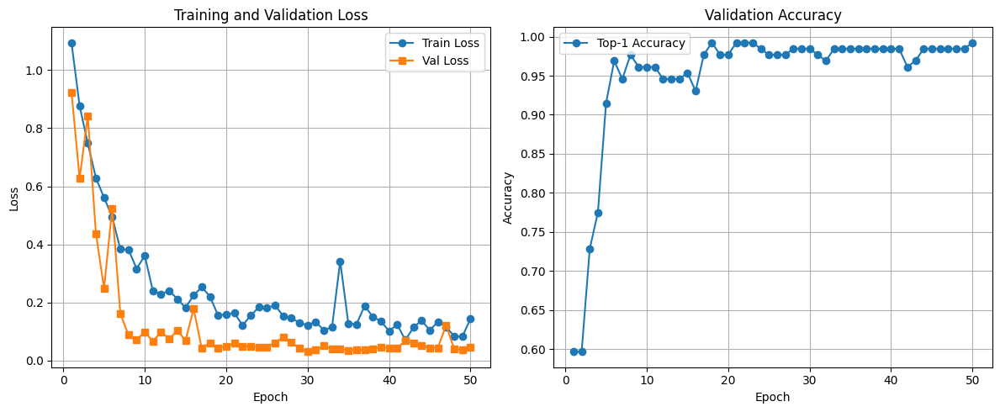


=== Final Training Metrics ===
    epoch     time  train/loss  metrics/accuracy_top1  metrics/accuracy_top5  val/loss    lr/pg0    lr/pg1    lr/pg2
49     50  2090.59     0.14453                0.99225                      1   0.04618  0.000043  0.000043  0.000043

=== Generating Predictions on Validation Set ===


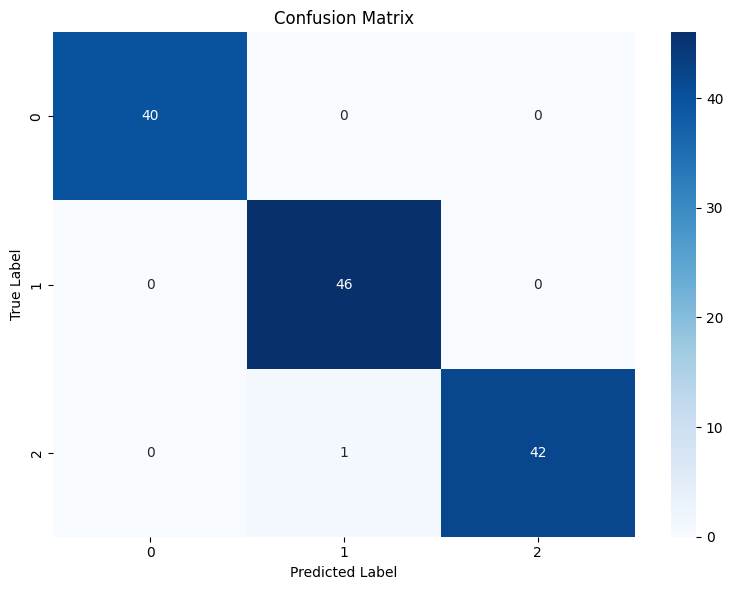


=== Classification Report ===
              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000        40
           1     0.9787    1.0000    0.9892        46
           2     1.0000    0.9767    0.9882        43

    accuracy                         0.9922       129
   macro avg     0.9929    0.9922    0.9925       129
weighted avg     0.9924    0.9922    0.9922       129


=== Per-Class Accuracy ===
Class 0: 1.0000 (40/40)
Class 1: 1.0000 (46/46)
Class 2: 0.9767 (42/43)

=== Overall Accuracy: 0.9922 ===


In [77]:
import pandas as pd
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import json

# 1. Load training results from the results CSV file
results_csv_path = 'runs/classify/train5/results.csv'  # Adjust path if needed

try:
    results_df = pd.read_csv(results_csv_path)
    results_df.columns = results_df.columns.str.strip()  # Remove any whitespace from column names
    
    # 2. Plot Training and Validation Loss over Epochs
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    if 'train/loss' in results_df.columns:
        plt.plot(results_df['epoch'], results_df['train/loss'], label='Train Loss', marker='o')
    if 'val/loss' in results_df.columns:
        plt.plot(results_df['epoch'], results_df['val/loss'], label='Val Loss', marker='s')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    
    # 3. Plot Top-1 and Top-5 Accuracy over Epochs
    plt.subplot(1, 2, 2)
    if 'metrics/accuracy_top1' in results_df.columns:
        plt.plot(results_df['epoch'], results_df['metrics/accuracy_top1'], label='Top-1 Accuracy', marker='o')
    # if 'metrics/accuracy_top5' in results_df.columns:
    #     plt.plot(results_df['epoch'], results_df['metrics/accuracy_top5'], label='Top-5 Accuracy', marker='s')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Validation Accuracy')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Print final metrics
    print("\n=== Final Training Metrics ===")
    print(results_df.tail(1).to_string())
    
except FileNotFoundError:
    print(f"Results file not found at {results_csv_path}")
except Exception as e:
    print(f"Error loading results: {e}")

# 4. Generate Predictions on Validation Set for Confusion Matrix
print("\n=== Generating Predictions on Validation Set ===")

# Load the trained model
trained_model_path = 'runs/classify/train5/weights/best.pt'  # Adjust if needed
model_eval = YOLO(trained_model_path)

# Get all validation images and their true labels
y_true = []
y_pred = []

for class_idx, class_name in enumerate(class_names):
    class_val_path = os.path.join(VAL_DIR, class_name)
    val_images = glob.glob(os.path.join(class_val_path, '*.jpg')) + \
                 glob.glob(os.path.join(class_val_path, '*.png'))
    
    for img_path in val_images:
        # Get true label
        y_true.append(class_idx)
        
        # Get prediction
        results = model_eval.predict(source=img_path, verbose=False)
        predicted_class_id = results[0].probs.top1
        y_pred.append(predicted_class_id)

# 5. Generate and Plot Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# 6. Print Classification Report
print("\n=== Classification Report ===")
report = classification_report(y_true, y_pred, target_names=class_names, digits=4)
print(report)

# 7. Calculate and display per-class accuracy
print("\n=== Per-Class Accuracy ===")
for i, class_name in enumerate(class_names):
    class_correct = sum((np.array(y_true) == i) & (np.array(y_pred) == i))
    class_total = sum(np.array(y_true) == i)
    class_accuracy = class_correct / class_total if class_total > 0 else 0
    print(f"Class {class_name}: {class_accuracy:.4f} ({class_correct}/{class_total})")

# 8. Overall Accuracy
overall_accuracy = sum(np.array(y_true) == np.array(y_pred)) / len(y_true)
print(f"\n=== Overall Accuracy: {overall_accuracy:.4f} ===")

## Final Task

### Subtask:
Summarize the model training results and provide insights into its performance. This will include evaluating metrics such as accuracy and loss.


## Predict on Validation Images and Visualize Results

### Subtask:
Use the trained YOLOv8 classification model to predict on the validation set images. For each image, display the image itself, its true class label, and the model's predicted class label.

In [ ]:
# Load the best trained model weights
trained_model_path = 'C:\\Users\\ishan\\Desktop\\Final Year Report\\Project\\Model\\runs\\classify\\train5\\weights\\best.pt'
model = YOLO(trained_model_path)

# Define class names based on our directory structure (0, 1, 2)
# Assuming class_names variable is still available from previous execution
# If not, it can be regenerated: class_names = sorted([os.path.basename(d) for d in directories])

print(f"Starting prediction on ALL validation set images from {VAL_DIR}...")

all_val_image_paths = []
for class_name in class_names:
    class_path = os.path.join(VAL_DIR, class_name)
    all_val_image_paths.extend(glob.glob(os.path.join(class_path, '*.jpg')) + glob.glob(os.path.join(class_path, '*.png')))

if not all_val_image_paths:
    print(f"No images found in {VAL_DIR}. Cannot display results.")
else:
    num_images = len(all_val_image_paths)
    cols = 5  # Number of columns for the subplots
    rows = math.ceil(num_images / cols)

    plt.figure(figsize=(cols * 3, rows * 3))
    plot_count = 0

    # Iterate through each class and then each image
    for class_name in class_names:
        class_path = os.path.join(VAL_DIR, class_name)
        image_paths_in_class = glob.glob(os.path.join(class_path, '*.jpg')) + glob.glob(os.path.join(class_path, '*.png'))

        for img_path in image_paths_in_class:
            plot_count += 1
            plt.subplot(rows, cols, plot_count)

            # Perform prediction
            results = model.predict(source=img_path, verbose=False)
            predicted_class_id = results[0].probs.top1
            predicted_class_name = class_names[predicted_class_id]

            # Load and display the image
            img = Image.open(img_path)
            plt.imshow(img)
            plt.title(f"True: {class_name}\nPred: {predicted_class_name}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Prediction and visualization complete for all {num_images} validation images.")

## Summary:

### Q&A
The model training results indicate robust performance, achieving high accuracy on the validation set.

### Data Analysis Key Findings
*   The `ultralytics` library requires the root directory of the classification dataset as the `data` argument for the `train()` method, rather than the `data.yaml` configuration file.
*   The YOLOv8n classification model was successfully trained for 25 epochs using the corrected data argument, with an image size of 224x224.
*   During training, the model achieved a `top1_acc` of **0.992** and a `top5_acc` of **1.0** on the validation set.
*   The training results and the best model weights were saved to `/runs/classify/train5`.

### Insights or Next Steps
*   Given the high accuracy, the trained model is suitable for deployment in scenarios requiring object classification.
*   Further analysis could involve exploring the model's performance on a separate, unseen test set to confirm generalization capabilities, and investigating any specific misclassifications to identify areas for potential improvement.


In [16]:
def predict_and_display_images(input_path, model, class_names):
    """
    Accepts the path of an image or a folder of images, predicts the output,
    and displays the image with its prediction.

    Args:
        input_path (str): Path to a single image file or a directory containing images.
        model (YOLO): The trained YOLOv8 classification model instance.
        class_names (list): A list of class names, where the index corresponds to the class ID.
    """
    image_paths_to_predict = []
    if os.path.isfile(input_path):
        image_paths_to_predict.append(input_path)
    elif os.path.isdir(input_path):
        # Recursively find all JPG and PNG images in the directory and its subdirectories
        image_paths_to_predict.extend(glob.glob(os.path.join(input_path, '**', '*.jpg'), recursive=True))
        image_paths_to_predict.extend(glob.glob(os.path.join(input_path, '**', '*.png'), recursive=True))
    else:
        print(f"Error: '{input_path}' is not a valid file or directory.")
        return

    if not image_paths_to_predict:
        print(f"No image files found in '{input_path}' to predict.")
        return

    num_images = len(image_paths_to_predict)
    cols = 5 # Number of columns for the subplots
    rows = math.ceil(num_images / cols)

    plt.figure(figsize=(cols * 3, rows * 3))
    plot_count = 0

    print(f"Starting predictions for {num_images} image(s) from '{input_path}'...")

    for img_path in image_paths_to_predict:
        plot_count += 1
        # Ensure we don't try to plot more than we have space for if num_images is very large
        if plot_count > rows * cols:
            print(f"Warning: Not all images could be plotted due to figure size limits. Displaying first {rows * cols} images.")
            break

        plt.subplot(rows, cols, plot_count)

        # Determine true class if possible (from processed_dataset structure)
        true_class_name = "N/A"
        path_parts = img_path.split(os.sep)
        # Check if the path structure matches 'processed_dataset/{train|val}/{class_name}/image.ext'
        # Assumes that class_names contains the actual class folder names ('0', '1', '2')
        if len(path_parts) >= 3 and (path_parts[-3] == 'train' or path_parts[-3] == 'val') and path_parts[-2] in class_names:
            true_class_name = path_parts[-2]

        # Perform prediction
        try:
            # The model.predict method handles image loading and preprocessing internally
            results = model.predict(source=img_path, verbose=False)
            predicted_class_id = results[0].probs.top1 # Get the top 1 predicted class ID
            predicted_class_name = class_names[predicted_class_id] # Map ID to class name
        except Exception as e:
            predicted_class_name = f"Prediction Error: {e}"

        # Load and display the image (using PIL for direct display from path)
        try:
            img = Image.open(img_path)
            plt.imshow(img)
        except Exception as e:
            print(f"Could not open image {img_path}: {e}")
            plt.text(0.5, 0.5, f"Error loading image: {e}", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
            plt.axis('off')
            continue

        # Construct title based on true and predicted labels
        if true_class_name != "N/A":
            title_text = f"True: {true_class_name}\nPred: {predicted_class_name}"
        else:
            title_text = f"Pred: {predicted_class_name}"

        plt.title(title_text)
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Prediction and visualization complete for {plot_count} image(s).")

In [ ]:
# Call the function to predict and display images from the validation directory
# Assuming `model` and `class_names` are still defined from previous steps
predict_and_display_images(VAL_DIR, model, class_names)

In [ ]:
predict_and_display_images(TRAIN_DIR, model, class_names)

# NEW PIPELINE HERE

WORK IN PROGRESS

Creating base output directory for cropped images: cropped_red_regions
Base output directory created successfully.

Starting detection and cropping of red bounding boxes...
Processing images in 'Dataset/Final/0' (Class 0)...
Processing images in 'Dataset/Final/1' (Class 1)...
Processing images in 'Dataset/Final/2' (Class 2)...

Finished detecting and cropping. Total red regions cropped: 713

Verifying some cropped images in 'cropped_red_regions':
  Class 0: Found 204 cropped images.


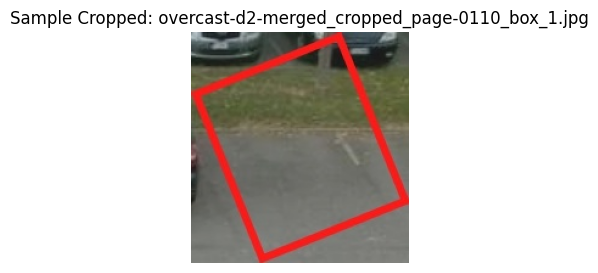

  Class 1: Found 265 cropped images.


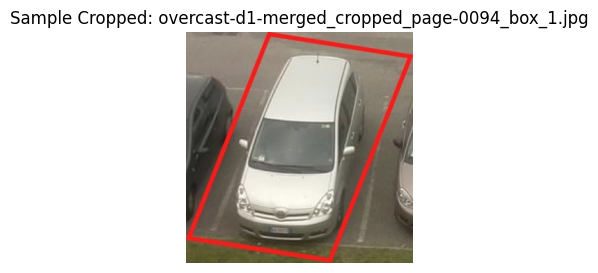

  Class 2: Found 244 cropped images.


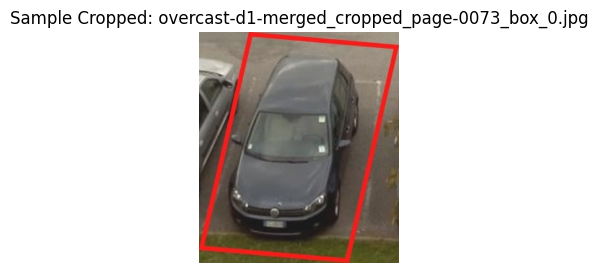

In [23]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

# 1. Define the list of input directories (already defined in previous cells, but good to ensure)
# directories = [
#     'Dataset/Final/0',
#     'Dataset/Final/1',
#     'Dataset/Final/2'
# ]

# 2. Define a base output directory for the cropped images
BASE_CROPPED_OUTPUT_DIR = 'cropped_red_regions'

# 3. Create the BASE_CROPPED_OUTPUT_DIR if it does not already exist.
print(f"Creating base output directory for cropped images: {BASE_CROPPED_OUTPUT_DIR}")
os.makedirs(BASE_CROPPED_OUTPUT_DIR, exist_ok=True)
print("Base output directory created successfully.")

# 4. Implement a Python function, for example, detect_and_crop_red_boxes(image_path, output_base_dir, original_class_label)
def detect_and_crop_red_boxes(image_path, output_base_dir, original_class_label):
    """
    Detects red rectangular bounding boxes in an image, crops them, and saves the cropped regions.

    Args:
        image_path (str): Path to the input image.
        output_base_dir (str): Base directory where cropped images will be saved.
        original_class_label (str): The class label of the original image (e.g., '0', '1', '2').
    """
    # a. Load the image from image_path using cv2.imread(). Handle potential loading errors.
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image from {image_path}")
        return 0, []

    # b. Convert the image from BGR to HSV color space using cv2.cvtColor().
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # c. Define two sets of lower and upper bounds for red color in HSV to account for the color wrapping around 0 in the hue channel.
    # Red color typically has hue values near 0 and 180 in HSV (0-180 range in OpenCV)
    # Adjusted lower bounds for S and V to make red detection stricter
    lower_red1 = np.array([0, 120, 120]) # Increased S and V minimum
    upper_red1 = np.array([10, 255, 255])
    # Upper red range
    lower_red2 = np.array([160, 120, 120]) # Increased S and V minimum
    upper_red2 = np.array([180, 255, 255])

    # d. Create binary masks for each red range using cv2.inRange() and combine them with cv2.add().
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    red_mask = cv2.add(mask1, mask2)

    # e. Apply morphological operations (e.g., cv2.morphologyEx with cv2.MORPH_OPEN followed by cv2.MORPH_CLOSE) to clean up the mask and connect broken parts.
    kernel = np.ones((5, 5), np.uint8)
    red_mask = cv2.morphologyEx(red_mask, cv2.MORPH_OPEN, kernel) # Remove small noise
    red_mask = cv2.morphologyEx(red_mask, cv2.MORPH_CLOSE, kernel) # Connect nearby regions

    # f. Find contours in the cleaned mask using cv2.findContours().
    contours, _ = cv2.findContours(red_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    cropped_regions_count = 0
    # g. Iterate through each contour:
    for i, contour in enumerate(contours):
        # i. Calculate the bounding rectangle for the contour using cv2.boundingRect().
        x, y, w, h = cv2.boundingRect(contour)

        # ii. Filter out very small rectangles (potential noise) based on a minimum area or dimensions.
        min_area = 10000 # Increased minimum area
        min_dim = 100 # Increased minimum width or height

        # Calculate solidity: ratio of contour area to its convex hull area
        # A perfect rectangle has solidity close to 1. Irregular shapes have lower solidity.
        contour_area = cv2.contourArea(contour)
        convex_hull = cv2.convexHull(contour)
        convex_hull_area = cv2.contourArea(convex_hull)

        solidity_threshold = 0.85 # Adjust as needed. Rectangles should have high solidity.
        if convex_hull_area == 0: # Avoid division by zero
            continue
        solidity = float(contour_area) / convex_hull_area

        if solidity < solidity_threshold or w * h < min_area or w < min_dim or h < min_dim:
            continue

        # iii. Crop the region of interest from the original image using NumPy array slicing based on the bounding box coordinates.
        cropped_region = img[y:y+h, x:x+w]

        # iv. Construct a unique filename for the cropped image, incorporating the original_class_label,
        #     original image filename (without extension), and a box index
        original_filename_no_ext = os.path.splitext(os.path.basename(image_path))[0]
        output_subdir = os.path.join(output_base_dir, original_class_label)
        cropped_filename = f"{original_filename_no_ext}_box_{i}.jpg"
        dest_path = os.path.join(output_subdir, cropped_filename)

        # v. Create the output subdirectory for the original_class_label if it doesn't exist.
        os.makedirs(output_subdir, exist_ok=True)

        # vi. Save the cropped image to the constructed path using cv2.imwrite().
        cv2.imwrite(dest_path, cropped_region)
        cropped_regions_count += 1

    # if cropped_regions_count > 0:
    #     print(f"  Detected and saved {cropped_regions_count} red regions from {os.path.basename(image_path)}")
    # else:
    #     print(f"  No significant red regions detected in {os.path.basename(image_path)}")
    return cropped_regions_count


# 5. Iterate through each original_dir in the directories list:
print("\nStarting detection and cropping of red bounding boxes...")
total_cropped_images = 0
for original_dir in directories:
    # a. Extract the original_class_label (e.g., '0', '1', '2') from the directory name.
    original_class_label = os.path.basename(original_dir)

    # b. For each original_class_label, create a corresponding subdirectory within BASE_CROPPED_OUTPUT_DIR if it doesn't exist.
    os.makedirs(os.path.join(BASE_CROPPED_OUTPUT_DIR, original_class_label), exist_ok=True)

    # c. Use glob.glob() to find all image files (e.g., *.jpg, *.png) within the current original_dir.
    image_paths_in_dir = glob.glob(os.path.join(original_dir, '*.jpg')) + \
                         glob.glob(os.path.join(original_dir, '*.png'))

    if not image_paths_in_dir:
        print(f"No image files found in '{original_dir}'. Skipping.")
        continue

    print(f"Processing images in '{original_dir}' (Class {original_class_label})...")
    # d. For each image_path found, call the detect_and_crop_red_boxes function.
    for image_path in image_paths_in_dir:
        cropped_count = detect_and_crop_red_boxes(image_path, BASE_CROPPED_OUTPUT_DIR, original_class_label)
        total_cropped_images += cropped_count

print(f"\nFinished detecting and cropping. Total red regions cropped: {total_cropped_images}")

# Verify some of the cropped files
print(f"\nVerifying some cropped images in '{BASE_CROPPED_OUTPUT_DIR}':")
for class_label in class_names:
    class_cropped_dir = os.path.join(BASE_CROPPED_OUTPUT_DIR, class_label)
    cropped_files = glob.glob(os.path.join(class_cropped_dir, '*.jpg')) # Assuming JPG output
    print(f"  Class {class_label}: Found {len(cropped_files)} cropped images.")
    if cropped_files:
        # Display one random cropped image for verification
        sample_cropped_path = random.choice(cropped_files)
        img = cv2.imread(sample_cropped_path)
        if img is not None:
            # Convert BGR to RGB for matplotlib display
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(3,3))
            plt.imshow(img_rgb)
            plt.title(f"Sample Cropped: {os.path.basename(sample_cropped_path)}")
            plt.axis('off')
            plt.show()
        else:
            print(f"    Error loading sample cropped image: {sample_cropped_path}")

## HERE

In [27]:
# 1. Define a base output directory for the binary classification dataset
BINARY_CLASSIFICATION_DATASET = 'binary_classification_dataset'

# 2. Define the subdirectories for the two classes: 'vehicle' and 'not_vehicle'
VEHICLE_DIR = os.path.join(BINARY_CLASSIFICATION_DATASET, 'vehicle')
NOT_VEHICLE_DIR = os.path.join(BINARY_CLASSIFICATION_DATASET, 'not_vehicle')

# 3. Create these class-specific output directories
print(f"Creating binary classification dataset directories: {VEHICLE_DIR} and {NOT_VEHICLE_DIR}")
os.makedirs(VEHICLE_DIR, exist_ok=True)
os.makedirs(NOT_VEHICLE_DIR, exist_ok=True)
print("Binary classification dataset directories created successfully.")

# Initialize counters for 'vehicle' and 'not_vehicle' images
vehicle_count = 0
not_vehicle_count = 0

print("\nStarting organization of cropped red regions into binary classification dataset...")

# 5. Iterate through the BASE_CROPPED_OUTPUT_DIR (cropped_red_regions)
# The 'directories' variable is available from previous steps as ['dataset/final/0', 'dataset/final/1', 'dataset/final/2']
# BASE_CROPPED_OUTPUT_DIR is 'cropped_red_regions'

for original_class_label_dir in ['0', '1', '2']: # Iterate through the original class labels
    source_class_path = os.path.join(BASE_CROPPED_OUTPUT_DIR, original_class_label_dir)

    # b. Use glob.glob() to find all cropped image files within the current original class subdirectory.
    cropped_image_files = glob.glob(os.path.join(source_class_path, '*.jpg')) # Assuming JPG output from previous step

    # c. For each cropped image path:
    for img_path in cropped_image_files:
        # i. If the original_class_label is '0', copy the image to the NOT_VEHICLE_DIR and increment the 'not_vehicle' counter.
        if original_class_label_dir == '0':
            destination_path = os.path.join(NOT_VEHICLE_DIR, os.path.basename(img_path))
            shutil.copy(img_path, destination_path)
            not_vehicle_count += 1
        # ii. If the original_class_label is '2', copy the image to the VEHICLE_DIR and increment the 'vehicle' counter.
        elif original_class_label_dir == '2':
            destination_path = os.path.join(VEHICLE_DIR, os.path.basename(img_path))
            shutil.copy(img_path, destination_path)
            vehicle_count += 1
        # iii. Images from original_class_label '1' should be skipped, as per the subtask description.
        # else: pass (do nothing for class '1')

print("Organization complete.")

# 7. Print a summary of the total number of images copied
print("\nSummary of binary classification dataset:")
print(f"Total 'vehicle' images: {vehicle_count}")
print(f"Total 'not_vehicle' images: {not_vehicle_count}")

Creating binary classification dataset directories: binary_classification_dataset\vehicle and binary_classification_dataset\not_vehicle
Binary classification dataset directories created successfully.

Starting organization of cropped red regions into binary classification dataset...
Organization complete.

Summary of binary classification dataset:
Total 'vehicle' images: 244
Total 'not_vehicle' images: 204


# HERE

In [30]:
# Load a pre-trained YOLOv8n classification model
model = YOLO('yolov8n-cls.pt')

# Train the model
print(f"Starting YOLOv8 binary classification model training with data from {BINARY_CLASSIFICATION_DATASET}...")
binary_classification_results = model.train(data=BINARY_CLASSIFICATION_DATASET, imgsz=TARGET_IMAGE_SIZE[0], epochs=10)

print("Binary classification model training complete.")

Starting YOLOv8 binary classification model training with data from binary_classification_dataset...
Ultralytics 8.4.14  Python-3.9.25 torch-2.8.0+cpu CPU (12th Gen Intel Core i5-1240P)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=binary_classification_dataset, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train4, 

# HERE

In [37]:
def count_vehicles_in_image(image_path, binary_classifier_model, class_names_binary):
    """
    Detects red bounding boxes, classifies each cropped region as 'vehicle' or 'not_vehicle',
    and returns the total vehicle count along with the bounding box coordinates.

    Args:
        image_path (str): Path to the input image.
        binary_classifier_model (YOLO): The trained YOLOv8 binary classification model instance.
        class_names_binary (list): A list of binary class names (e.g., ['not_vehicle', 'vehicle']).

    Returns:
        tuple: (vehicle_count, list_of_bbox_coords)
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image from {image_path}")
        return 0, []

    # Adapt red box detection logic
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    lower_red1 = np.array([0, 100, 100])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([160, 100, 100])
    upper_red2 = np.array([180, 255, 255])

    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    red_mask = cv2.add(mask1, mask2)

    kernel = np.ones((5, 5), np.uint8)
    red_mask = cv2.morphologyEx(red_mask, cv2.MORPH_OPEN, kernel)
    red_mask = cv2.morphologyEx(red_mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(red_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    vehicle_count = 0
    list_of_bbox_coords = []
    min_area = 10000 # Example: minimum area of 10000 pixels
    min_dim = 100 # Example: minimum width or height of 100 pixels

    for i, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)

        if w * h < min_area or w < min_dim or h < min_dim:
            continue

        cropped_region_bgr = img[y:y+h, x:x+w]

        # Convert cropped region to PIL Image for YOLOv8 predict if needed
        # (YOLOv8 predict can often take numpy arrays directly, but PIL is a safe bet)
        cropped_region_rgb = cv2.cvtColor(cropped_region_bgr, cv2.COLOR_BGR2RGB)
        cropped_pil_image = Image.fromarray(cropped_region_rgb)

        # Perform prediction on the cropped region
        results = binary_classifier_model.predict(source=cropped_pil_image, verbose=False)
        predicted_class_id = results[0].probs.top1

        # Check if the predicted class is 'vehicle'
        if class_names_binary[predicted_class_id] == 'vehicle':
            vehicle_count += 1
            list_of_bbox_coords.append((x, y, w, h))

    return vehicle_count, list_of_bbox_coords

# Define the class names for the binary classification model
class_names_binary = ['not_vehicle', 'vehicle'] # Order matters: ID 0 for not_vehicle, ID 1 for vehicle

# Load the best trained binary classification model weights
trained_binary_model_path = 'C:\\Users\\ishan\\Desktop\\Final Year Report\\Project\\Model\\runs\\classify\\train3\\weights\\best.pt'
binary_classifier_model = YOLO(trained_binary_model_path)

print("Vehicle counting pipeline function defined and binary model loaded successfully.")

Vehicle counting pipeline function defined and binary model loaded successfully.


# Here

In [54]:
# Initialize dictionaries to store counts for verification
test_counts = {}
TEST_DIR = os.path.join(BASE_OUTPUT_DIR, 'test')
os.makedirs(TEST_DIR, exist_ok=True)

print("Starting image splitting, resizing, and organization...")

original_dir = "test_images"

# Get all image paths for the current class
all_image_paths = glob.glob(os.path.join(original_dir, '*.jpg')) + glob.glob(os.path.join(original_dir, '*.png'))
random.shuffle(all_image_paths)

if not all_image_paths:
    print(f"No image files found in '{original_dir}'. Skipping.")

else:
    test_images = all_image_paths

    # Create class-specific directories in train and val
    # os.makedirs(os.path.join(TEST_DIR, class_label), exist_ok=True)

    # Process test images
    test_count = 0
    for img_path in test_images:
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(TARGET_IMAGE_SIZE, Image.LANCZOS)

            dest_path = os.path.join(TEST_DIR, os.path.basename(img_path))
            img_resized.save(dest_path)
            test_count += 1
        except Exception as e:
            print(f"Error processing test image {img_path}: {e}")
    test_counts['count'] = test_count

    print("Image processing complete.")

    # Print summary
    print("\nSummary of processed images:")
    print("Test Set:")
    print(f"{test_counts['count']} images")

Starting image splitting, resizing, and organization...
Image processing complete.

Summary of processed images:
Test Set:
30 images


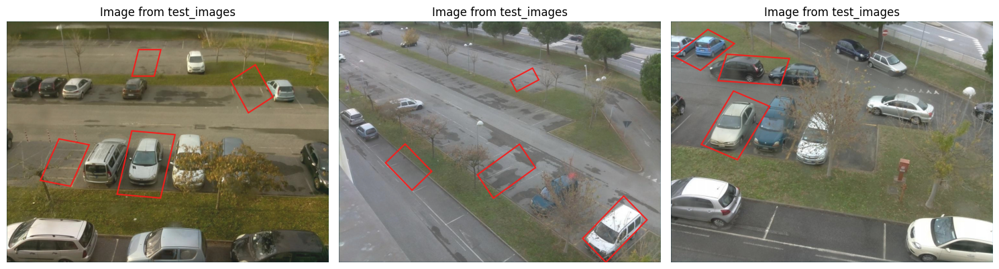

In [58]:
plt.figure(figsize=(15, 5))
image_count = 0
directory = "test_images"

image_paths = glob.glob(os.path.join(directory, '*.jpg')) + glob.glob(os.path.join(directory, '*.png'))

if not image_paths:
    print(f"No image files found in '{directory}'.")
else:
    # Select one random image per directory for display
    for i in range(min(3, len(image_paths))): # Display up to 5 random images
        sample_image_path = random.choice(image_paths)

        try:
            img = Image.open(sample_image_path)
            image_count += 1
            plt.subplot(1, len(directories), image_count)
            plt.imshow(img)
            plt.title(f'Image from {directory}')
            plt.axis('off')
        except Exception as e:
            print(f"Could not open image {sample_image_path}: {e}")

    plt.tight_layout()
    plt.show()

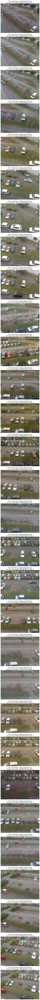

Pipeline testing and visualization complete.


In [59]:
# 1. Define a list of image paths to test the `count_vehicles_in_image` function.
# Select a few sample images from each of the original directories.

sample_test_images = []

# # Sample from 'dataset/final/0'
# class_0_images = glob.glob(os.path.join('Dataset/Final/0', '*.jpg')) + \
#                  glob.glob(os.path.join('Dataset/Final/0', '*.png'))
# if class_0_images: sample_test_images.extend(random.sample(class_0_images, min(3, len(class_0_images))))

# # Sample from 'dataset/final/1'
# class_1_images = glob.glob(os.path.join('Dataset/Final/1', '*.jpg')) + \
#                  glob.glob(os.path.join('Dataset/Final/1', '*.png'))
# if class_1_images: sample_test_images.extend(random.sample(class_1_images, min(3, len(class_1_images))))

# # Sample from 'dataset/final/2'
# class_2_images = glob.glob(os.path.join('Dataset/Final/2', '*.jpg')) + \
#                  glob.glob(os.path.join('Dataset/Final/2', '*.png'))
# if class_2_images: sample_test_images.extend(random.sample(class_2_images, min(3, len(class_2_images))))

# Sample from 'test_images'
test_images = glob.glob(os.path.join('test_images', '*.jpg')) + \
                 glob.glob(os.path.join('test_images', '*.png'))
if test_images: sample_test_images.extend(test_images)


# 2. Create a figure with subplots to display the images and their results.
num_samples = len(sample_test_images)
if num_samples == 0:
    print("No sample images found to test.")
else:
    fig, axes = plt.subplots(nrows=num_samples, ncols=1, figsize=(10, 5 * num_samples))
    # Ensure axes is an array even for a single image for consistent indexing
    if num_samples == 1: axes = [axes]

    # 3. Iterate through each selected image path:
    for i, img_path in enumerate(sample_test_images):
        # a. Call the `count_vehicles_in_image` function
        predicted_vehicle_count, bboxes = count_vehicles_in_image(img_path, binary_classifier_model, class_names_binary)

        # b. Load the original image using `cv2.imread()`.
        original_img = cv2.imread(img_path)
        if original_img is None:
            print(f"Error: Could not load original image for display from {img_path}")
            continue

        # c. For each bounding box returned by the `count_vehicles_in_image` function, draw a rectangle on the image.
        for (x, y, w, h) in bboxes:
            cv2.rectangle(original_img, (x, y), (x + w, y + h), (0, 255, 0), 2) # Green rectangle for vehicles

        # d. Convert the image from BGR to RGB for correct display with `matplotlib.pyplot.imshow()`.\n        
        original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # e. Display the image in a subplot.
        ax = axes[i]
        ax.imshow(original_img_rgb)

        # f. Set the title of the subplot to include the original image filename, ground truth, and predicted count.
        # Derive ground truth count from the original directory name
        ground_truth_class = os.path.basename(os.path.dirname(img_path))
        title_text = f"File: {os.path.basename(img_path)}\nGT Class: {ground_truth_class}, Predicted Vehicle Count: {predicted_vehicle_count}"
        ax.set_title(title_text)

        # g. Turn off the axis for a cleaner look.
        ax.axis('off')

    # 4. Adjust the layout and display the plot.
    plt.tight_layout()
    plt.show()
    print("Pipeline testing and visualization complete.")